# Appendix 1. Import Libraries and Functions

In [1]:
import keras

In [2]:
keras.backend.clear_session()

In [3]:
import tensorflow as tf

In [4]:
import pandas as pd

In [5]:
import numpy as np

In [6]:
from tf_explain.core.activations import ExtractActivations
from tensorflow.keras.applications.xception import decode_predictions
from tensorflow.keras.applications import Xception

In [7]:
from keras import layers
from keras import models

In [8]:
import matplotlib.pyplot as plt

In [9]:
from keras.callbacks import ModelCheckpoint

# Appendix 2. Loading the Dataset

In [6]:
train_ds = keras.utils.image_dataset_from_directory(
    directory='smoking/Training',
    labels="inferred",
    color_mode="rgb",
    label_mode='binary',
    batch_size=128,
    image_size=(250, 250))

validation_ds = keras.utils.image_dataset_from_directory(
    directory='smoking/Validation',
    labels="inferred",
    color_mode="rgb",
    label_mode='binary',
    batch_size=128,
    image_size=(250, 250))

test_ds = keras.utils.image_dataset_from_directory(
    directory='smoking/Testing',
    labels="inferred",
    color_mode="rgb",
    label_mode='binary',
    batch_size=128,
    image_size=(250, 250))

Found 720 files belonging to 2 classes.
Found 180 files belonging to 2 classes.
Found 257 files belonging to 2 classes.


# Appendix 3. Baseline Model

In [11]:
model = models.Sequential()
model.add(layers.Rescaling(1./255))
model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(250, 250, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [12]:
checkpoint_filepath = 'model_checkpoint_baseline.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])
history = model.fit(train_ds, validation_data=validation_ds, epochs=30, batch_size=256, callbacks=[model_checkpoint_callback])

Epoch 1/30


2024-06-08 17:34:51.457864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


6/6 [==============================] - 3s 286ms/step - loss: 26.8776 - accuracy: 0.5167 - recall: 0.4448 - precision: 0.5227 - val_loss: 1.1504 - val_accuracy: 0.6778 - val_recall: 0.5667 - val_precision: 0.7286
Epoch 2/30


/Users/pmmedina/anaconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


6/6 [==============================] - 1s 235ms/step - loss: 1.4381 - accuracy: 0.6625 - recall: 0.6575 - precision: 0.6667 - val_loss: 1.0355 - val_accuracy: 0.7167 - val_recall: 0.7778 - val_precision: 0.6931
Epoch 3/30
6/6 [==============================] - 1s 220ms/step - loss: 1.3249 - accuracy: 0.6681 - recall: 0.7431 - precision: 0.6482 - val_loss: 0.9590 - val_accuracy: 0.7000 - val_recall: 0.6333 - val_precision: 0.7308
Epoch 4/30
6/6 [==============================] - 1s 219ms/step - loss: 1.1675 - accuracy: 0.6639 - recall: 0.6381 - precision: 0.6754 - val_loss: 2.7180 - val_accuracy: 0.4944 - val_recall: 0.9778 - val_precision: 0.4972
Epoch 5/30
6/6 [==============================] - 1s 216ms/step - loss: 2.0986 - accuracy: 0.5903 - recall: 0.5110 - precision: 0.6106 - val_loss: 2.1694 - val_accuracy: 0.5778 - val_recall: 0.2111 - val_precision: 0.7917
Epoch 6/30
6/6 [==============================] - 1s 215ms/step - loss: 2.0659 - accuracy: 0.5681 - recall: 0.4365 - precis

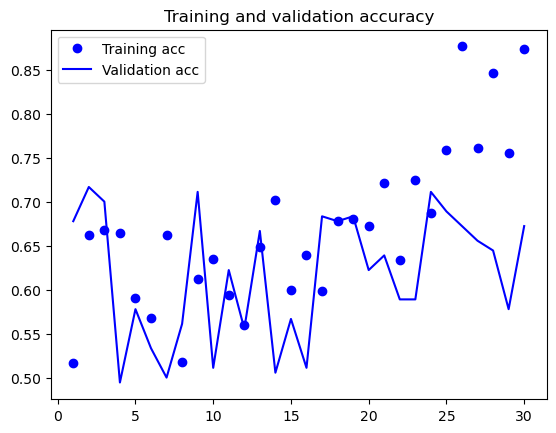

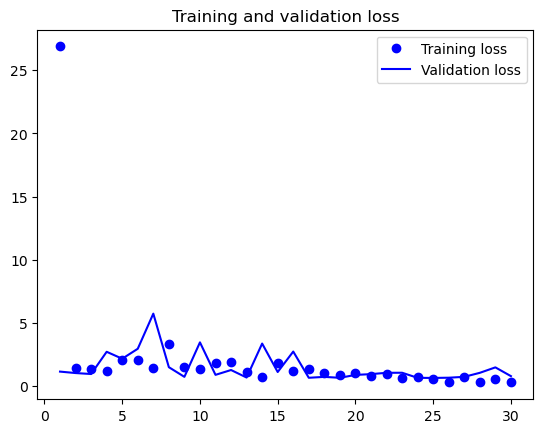

In [13]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 1.</b> Training and Validation Accuracy and Loss of Simple CNN</center>

In [14]:
np.argmax(history.history['val_accuracy'])

1

In [15]:
history.history['val_accuracy'][1]

0.7166666984558105

In [16]:
history.history['val_precision'][1]

0.6930692791938782

In [17]:
history.history['val_recall'][1]

0.7777777910232544

In [18]:
keras.backend.clear_session()

# Appendix 4. Baseline Model with Data Augmentation

In [19]:
data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2, fill_mode="nearest"),
  layers.RandomTranslation(height_factor=0.2,
                           width_factor=0.2,
                           fill_mode="nearest"),
  layers.RandomBrightness(0.2),
  layers.RandomContrast(0.2),
  layers.RandomZoom(height_factor=0.2,
                    width_factor=0.2,
                    fill_mode="nearest")
])

In [20]:
model = models.Sequential()
model.add(layers.Rescaling(1./255))
model.add(data_augmentation)
model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(250, 250, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [21]:
checkpoint_filepath = 'model_checkpoint_baseline_aug.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])
history = model.fit(train_ds, validation_data=validation_ds, epochs=30, batch_size=256, callbacks=[model_checkpoint_callback])

Epoch 1/30


2024-06-08 17:36:06.256657: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:06.256767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 8s - loss: 1.4452 - accuracy: 0.4219 - recall: 0.1571 - precision: 0.4231

2024-06-08 17:36:06.959480: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:06.961055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 314.4227 - accuracy: 0.4531 - recall: 0.5530 - precision: 0.4740

2024-06-08 17:36:07.385894: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:07.385895: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 299.1443 - accuracy: 0.4557 - recall: 0.3632 - precision: 0.4740

2024-06-08 17:36:07.715994: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:07.716122: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 239.4700 - accuracy: 0.4727 - recall: 0.2786 - precision: 0.4740

2024-06-08 17:36:08.031190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:08.031210: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 203.2052 - accuracy: 0.4719 - recall: 0.4130 - precision: 0.4716

2024-06-08 17:36:08.334801: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:08.334881: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 4s 456ms/step - loss: 180.8057 - accuracy: 0.4847 - recall: 0.4448 - precision: 0.4864 - val_loss: 1.4361 - val_accuracy: 0.4667 - val_recall: 0.9000 - val_precision: 0.4821
Epoch 2/30


2024-06-08 17:36:09.244361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:09.244428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 31.4728 - accuracy: 0.5469 - recall: 1.0000 - precision: 0.5469

2024-06-08 17:36:09.695284: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:09.695418: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 39.5330 - accuracy: 0.4844 - recall: 0.7319 - precision: 0.5153

2024-06-08 17:36:10.023754: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:10.023844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 29.5995 - accuracy: 0.5026 - recall: 0.8213 - precision: 0.5247

2024-06-08 17:36:10.352816: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:10.353136: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 23.6069 - accuracy: 0.5020 - recall: 0.8253 - precision: 0.5163

2024-06-08 17:36:10.675901: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:10.677797: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 19.3126 - accuracy: 0.5141 - recall: 0.8187 - precision: 0.5192

2024-06-08 17:36:10.985266: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:10.985269: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 383ms/step - loss: 17.6233 - accuracy: 0.5208 - recall: 0.8011 - precision: 0.5151 - val_loss: 0.8585 - val_accuracy: 0.5000 - val_recall: 0.0222 - val_precision: 0.5000
Epoch 3/30


2024-06-08 17:36:11.616361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:11.616361: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 2.5889 - accuracy: 0.5156 - recall: 0.3529 - precision: 0.5714

2024-06-08 17:36:12.055588: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:12.055743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 2.1522 - accuracy: 0.5039 - recall: 0.4683 - precision: 0.4958

2024-06-08 17:36:12.374102: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:12.374113: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 3.6605 - accuracy: 0.4870 - recall: 0.4891 - precision: 0.4663

2024-06-08 17:36:12.701950: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:12.702055: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 3.3158 - accuracy: 0.4844 - recall: 0.4275 - precision: 0.4802

2024-06-08 17:36:13.051372: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:13.051397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 3.8311 - accuracy: 0.4969 - recall: 0.5463 - precision: 0.5028

2024-06-08 17:36:13.368902: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:13.368915: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 366ms/step - loss: 3.9760 - accuracy: 0.5069 - recall: 0.5442 - precision: 0.5090 - val_loss: 0.8100 - val_accuracy: 0.3556 - val_recall: 0.3444 - val_precision: 0.3523
Epoch 4/30


2024-06-08 17:36:13.884526: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:13.884529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 7.2116 - accuracy: 0.5234 - recall: 0.9853 - precision: 0.5276

2024-06-08 17:36:14.309707: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:14.309811: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 5.2637 - accuracy: 0.5195 - recall: 0.6000 - precision: 0.5235

2024-06-08 17:36:14.623844: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:14.623940: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 5.6863 - accuracy: 0.5104 - recall: 0.5635 - precision: 0.5211

2024-06-08 17:36:14.957427: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:14.958660: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 4.8248 - accuracy: 0.5137 - recall: 0.6360 - precision: 0.5188

2024-06-08 17:36:15.282584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:15.285125: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 4.8649 - accuracy: 0.5063 - recall: 0.5679 - precision: 0.5111

2024-06-08 17:36:15.603291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:15.603303: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 387ms/step - loss: 4.6778 - accuracy: 0.5069 - recall: 0.6077 - precision: 0.5081 - val_loss: 0.8394 - val_accuracy: 0.5056 - val_recall: 0.0111 - val_precision: 1.0000
Epoch 5/30


2024-06-08 17:36:16.249430: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:16.249431: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 3.0858 - accuracy: 0.4531 - recall: 0.0312 - precision: 0.2000

2024-06-08 17:36:16.676700: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:16.677471: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 4.7737 - accuracy: 0.4727 - recall: 0.4341 - precision: 0.4746

2024-06-08 17:36:17.017387: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:17.018138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 4.7549 - accuracy: 0.4870 - recall: 0.3918 - precision: 0.4903

2024-06-08 17:36:17.373585: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:17.373850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 6.3346 - accuracy: 0.4746 - recall: 0.5178 - precision: 0.4712

2024-06-08 17:36:17.696520: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:17.696720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 6.1853 - accuracy: 0.4641 - recall: 0.4702 - precision: 0.4630

2024-06-08 17:36:18.017397: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:18.017446: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 375ms/step - loss: 6.4260 - accuracy: 0.4708 - recall: 0.5193 - precision: 0.4759 - val_loss: 0.7438 - val_accuracy: 0.4556 - val_recall: 0.2556 - val_precision: 0.4259
Epoch 6/30


2024-06-08 17:36:18.549438: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:18.549458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 3.2939 - accuracy: 0.4766 - recall: 0.7581 - precision: 0.4747

2024-06-08 17:36:18.987557: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:18.987579: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 2.9153 - accuracy: 0.5234 - recall: 0.5865 - precision: 0.5379

2024-06-08 17:36:19.330782: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:19.330835: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 3.2348 - accuracy: 0.5130 - recall: 0.6884 - precision: 0.5229

2024-06-08 17:36:19.662112: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:19.662133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 3.3730 - accuracy: 0.5137 - recall: 0.5602 - precision: 0.5302

2024-06-08 17:36:19.991561: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:19.992794: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 3.7791 - accuracy: 0.5063 - recall: 0.5833 - precision: 0.5108

2024-06-08 17:36:20.320688: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:20.320684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 371ms/step - loss: 4.4760 - accuracy: 0.5125 - recall: 0.5801 - precision: 0.5134 - val_loss: 0.7966 - val_accuracy: 0.4444 - val_recall: 0.1444 - val_precision: 0.3611
Epoch 7/30


2024-06-08 17:36:20.842802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:20.842825: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 5.7376 - accuracy: 0.4688 - recall: 0.4412 - precision: 0.5000

2024-06-08 17:36:21.262004: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:21.265886: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 8.3733 - accuracy: 0.4766 - recall: 0.5940 - precision: 0.4969

2024-06-08 17:36:21.578819: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:21.579899: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 8.4871 - accuracy: 0.4714 - recall: 0.6489 - precision: 0.4710

2024-06-08 17:36:21.918998: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:21.920075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 26.4280 - accuracy: 0.4785 - recall: 0.4841 - precision: 0.4710

2024-06-08 17:36:22.258099: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:22.258740: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 22.0497 - accuracy: 0.4875 - recall: 0.4406 - precision: 0.4862

2024-06-08 17:36:22.580287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:22.580291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 368ms/step - loss: 20.2320 - accuracy: 0.4889 - recall: 0.4696 - precision: 0.4913 - val_loss: 1.3376 - val_accuracy: 0.5000 - val_recall: 1.0000 - val_precision: 0.5000
Epoch 8/30


2024-06-08 17:36:23.103777: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:23.103781: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 25.8615 - accuracy: 0.5078 - recall: 1.0000 - precision: 0.5078

2024-06-08 17:36:23.543462: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:23.545104: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 37.1234 - accuracy: 0.4961 - recall: 0.6953 - precision: 0.4972

2024-06-08 17:36:23.890324: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:23.890647: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 27.2824 - accuracy: 0.4844 - recall: 0.6862 - precision: 0.4813

2024-06-08 17:36:24.226645: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:24.226720: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 21.4698 - accuracy: 0.4883 - recall: 0.5748 - precision: 0.4867

2024-06-08 17:36:24.554328: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:24.554510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 19.1559 - accuracy: 0.4969 - recall: 0.6552 - precision: 0.4964

2024-06-08 17:36:24.876190: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:24.877234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 369ms/step - loss: 18.2143 - accuracy: 0.4917 - recall: 0.5939 - precision: 0.4954 - val_loss: 0.7698 - val_accuracy: 0.4000 - val_recall: 0.7556 - val_precision: 0.4416
Epoch 9/30


2024-06-08 17:36:25.388694: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:25.388716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 7.0331 - accuracy: 0.4922 - recall: 0.8806 - precision: 0.5086

2024-06-08 17:36:25.808698: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:25.808729: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 6.6504 - accuracy: 0.4844 - recall: 0.8217 - precision: 0.4930

2024-06-08 17:36:26.160295: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:26.160300: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 10.1708 - accuracy: 0.4740 - recall: 0.5612 - precision: 0.4867

2024-06-08 17:36:26.487858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:26.487892: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 10.4438 - accuracy: 0.4863 - recall: 0.6189 - precision: 0.5031

2024-06-08 17:36:26.830428: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:26.830570: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 9.3187 - accuracy: 0.4859 - recall: 0.6246 - precision: 0.4951 

2024-06-08 17:36:27.139251: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:27.139325: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 390ms/step - loss: 9.4514 - accuracy: 0.4931 - recall: 0.5635 - precision: 0.4964 - val_loss: 0.7196 - val_accuracy: 0.5222 - val_recall: 0.1778 - val_precision: 0.5714
Epoch 10/30


2024-06-08 17:36:27.765065: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:27.765062: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 4.0117 - accuracy: 0.5078 - recall: 0.3529 - precision: 0.5581

2024-06-08 17:36:28.191572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:28.191627: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 6.8066 - accuracy: 0.4961 - recall: 0.4926 - precision: 0.5276

2024-06-08 17:36:28.506108: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:28.508822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 8.7652 - accuracy: 0.4870 - recall: 0.5842 - precision: 0.5108

2024-06-08 17:36:28.833412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:28.834858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 8.1804 - accuracy: 0.4883 - recall: 0.5206 - precision: 0.5092

2024-06-08 17:36:29.161577: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:29.164012: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 7.9274 - accuracy: 0.4813 - recall: 0.5335 - precision: 0.4944

2024-06-08 17:36:29.478642: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:29.478650: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 358ms/step - loss: 7.8641 - accuracy: 0.4861 - recall: 0.5028 - precision: 0.4892 - val_loss: 0.7079 - val_accuracy: 0.5222 - val_recall: 0.4222 - val_precision: 0.5278
Epoch 11/30


2024-06-08 17:36:29.983743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:29.983743: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 5.5366 - accuracy: 0.5312 - recall: 0.4839 - precision: 0.5172

2024-06-08 17:36:30.406975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:30.407023: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 9.1127 - accuracy: 0.5039 - recall: 0.2419 - precision: 0.4762

2024-06-08 17:36:30.718205: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:30.719542: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 9.3445 - accuracy: 0.5078 - recall: 0.4339 - precision: 0.5000

2024-06-08 17:36:31.059439: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:31.059436: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 8.7760 - accuracy: 0.4863 - recall: 0.3992 - precision: 0.4648

2024-06-08 17:36:31.379911: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:31.380085: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 7.9580 - accuracy: 0.5031 - recall: 0.3774 - precision: 0.4835

2024-06-08 17:36:31.706513: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:31.706511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 360ms/step - loss: 7.6730 - accuracy: 0.5181 - recall: 0.4558 - precision: 0.5238 - val_loss: 0.7199 - val_accuracy: 0.4722 - val_recall: 0.2556 - val_precision: 0.4510
Epoch 12/30


2024-06-08 17:36:32.206807: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:32.206874: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 6.3102 - accuracy: 0.4609 - recall: 0.7857 - precision: 0.4356

2024-06-08 17:36:32.628809: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:32.631217: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 7.8112 - accuracy: 0.5156 - recall: 0.7109 - precision: 0.5112

2024-06-08 17:36:32.956218: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:32.956261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 9.3859 - accuracy: 0.5078 - recall: 0.7906 - precision: 0.5033

2024-06-08 17:36:33.314191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:33.315615: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 9.2338 - accuracy: 0.5215 - recall: 0.7385 - precision: 0.5203

2024-06-08 17:36:33.625193: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:33.625208: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 9.2273 - accuracy: 0.5047 - recall: 0.7375 - precision: 0.5032

2024-06-08 17:36:33.944607: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:33.944621: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 370ms/step - loss: 10.3496 - accuracy: 0.5042 - recall: 0.6630 - precision: 0.5053 - val_loss: 0.8011 - val_accuracy: 0.4333 - val_recall: 0.8333 - val_precision: 0.4630
Epoch 13/30


2024-06-08 17:36:34.483984: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:34.483985: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 11.5043 - accuracy: 0.4375 - recall: 0.7500 - precision: 0.4412

2024-06-08 17:36:34.903191: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:34.903916: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 9.1482 - accuracy: 0.4922 - recall: 0.6080 - precision: 0.4841 

2024-06-08 17:36:35.216767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:35.216770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 9.7187 - accuracy: 0.4714 - recall: 0.5508 - precision: 0.4640

2024-06-08 17:36:35.560789: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:35.560879: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 11.0377 - accuracy: 0.4863 - recall: 0.4240 - precision: 0.4711

2024-06-08 17:36:35.889176: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:35.889188: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 10.4997 - accuracy: 0.4688 - recall: 0.4049 - precision: 0.4748

2024-06-08 17:36:36.211133: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:36.211142: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 364ms/step - loss: 10.4226 - accuracy: 0.4778 - recall: 0.3702 - precision: 0.4752 - val_loss: 0.7814 - val_accuracy: 0.5056 - val_recall: 0.0111 - val_precision: 1.0000
Epoch 14/30


2024-06-08 17:36:36.728098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:36.728098: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 8.3213 - accuracy: 0.3828 - recall: 0.2537 - precision: 0.3696

2024-06-08 17:36:37.165455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:37.165457: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 7.4481 - accuracy: 0.4414 - recall: 0.2815 - precision: 0.4524

2024-06-08 17:36:37.475556: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:37.475591: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 7.2732 - accuracy: 0.4505 - recall: 0.2488 - precision: 0.4545

2024-06-08 17:36:37.826164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:37.826412: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 8.3118 - accuracy: 0.4551 - recall: 0.2901 - precision: 0.4497

2024-06-08 17:36:38.150687: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:38.150714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 9.0508 - accuracy: 0.4719 - recall: 0.2438 - precision: 0.4593

2024-06-08 17:36:38.474059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:38.474060: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 365ms/step - loss: 8.6747 - accuracy: 0.4708 - recall: 0.2403 - precision: 0.4508 - val_loss: 0.8995 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 15/30


2024-06-08 17:36:38.990699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:38.990699: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 4.7288 - accuracy: 0.5312 - recall: 0.8594 - precision: 0.5189

2024-06-08 17:36:39.433712: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:39.433716: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 6.6515 - accuracy: 0.4961 - recall: 0.7154 - precision: 0.4835

2024-06-08 17:36:39.748936: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:39.750544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 7.1082 - accuracy: 0.4922 - recall: 0.7872 - precision: 0.4884

2024-06-08 17:36:40.083056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:40.083180: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 6.2608 - accuracy: 0.5059 - recall: 0.6914 - precision: 0.4855

2024-06-08 17:36:40.407845: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:40.408292: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 6.3459 - accuracy: 0.5031 - recall: 0.6238 - precision: 0.4911

2024-06-08 17:36:40.724925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:40.724926: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 362ms/step - loss: 6.1062 - accuracy: 0.5194 - recall: 0.6630 - precision: 0.5172 - val_loss: 1.1402 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 16/30


2024-06-08 17:36:41.242739: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:41.242830: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 4.1841 - accuracy: 0.5625 - recall: 0.7121 - precision: 0.5595

2024-06-08 17:36:41.732614: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:41.734238: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 5.2005 - accuracy: 0.5195 - recall: 0.6179 - precision: 0.5000

2024-06-08 17:36:42.050918: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:42.052265: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 24.7476 - accuracy: 0.5078 - recall: 0.4167 - precision: 0.5096

2024-06-08 17:36:42.394252: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:42.403536: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 48.2270 - accuracy: 0.5137 - recall: 0.4196 - precision: 0.5144

2024-06-08 17:36:42.727652: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:42.728842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 83.9288 - accuracy: 0.5078 - recall: 0.3447 - precision: 0.5163

2024-06-08 17:36:43.045864: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:43.045925: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 368ms/step - loss: 86.3999 - accuracy: 0.5069 - recall: 0.4171 - precision: 0.5119 - val_loss: 3.6447 - val_accuracy: 0.4889 - val_recall: 0.9778 - val_precision: 0.4944
Epoch 17/30


2024-06-08 17:36:43.575262: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:43.575275: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 121.4268 - accuracy: 0.4844 - recall: 0.9153 - precision: 0.4696

2024-06-08 17:36:43.995074: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:43.996595: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 116.2601 - accuracy: 0.5039 - recall: 0.7630 - precision: 0.5202

2024-06-08 17:36:44.306244: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:44.306259: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 129.5987 - accuracy: 0.4948 - recall: 0.8182 - precision: 0.5063

2024-06-08 17:36:44.655582: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:44.656313: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 138.2121 - accuracy: 0.5000 - recall: 0.8023 - precision: 0.5084

2024-06-08 17:36:44.998429: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:44.998447: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 133.2785 - accuracy: 0.4969 - recall: 0.7764 - precision: 0.5000

2024-06-08 17:36:45.313584: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:45.314606: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 366ms/step - loss: 122.7786 - accuracy: 0.4917 - recall: 0.7624 - precision: 0.4964 - val_loss: 1.2677 - val_accuracy: 0.5111 - val_recall: 0.0222 - val_precision: 1.0000
Epoch 18/30


2024-06-08 17:36:45.826850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:45.826849: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 49.7284 - accuracy: 0.4922 - recall: 0.4857 - precision: 0.5397

2024-06-08 17:36:46.256261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:46.256371: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 33.0495 - accuracy: 0.5234 - recall: 0.5725 - precision: 0.5319

2024-06-08 17:36:46.575867: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:46.575891: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 36.6205 - accuracy: 0.5339 - recall: 0.4615 - precision: 0.5488

2024-06-08 17:36:46.922458: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:46.927778: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 69.4980 - accuracy: 0.5391 - recall: 0.5962 - precision: 0.5505

2024-06-08 17:36:47.264071: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:47.264417: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 73.6833 - accuracy: 0.5156 - recall: 0.6542 - precision: 0.5134

2024-06-08 17:36:47.596646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:47.596646: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 371ms/step - loss: 86.3008 - accuracy: 0.5125 - recall: 0.5801 - precision: 0.5134 - val_loss: 1.1183 - val_accuracy: 0.4611 - val_recall: 0.9000 - val_precision: 0.4793
Epoch 19/30


2024-06-08 17:36:48.112770: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:48.113236: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 20.8766 - accuracy: 0.5000 - recall: 0.9242 - precision: 0.5083

2024-06-08 17:36:48.550608: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:48.550975: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 49.2472 - accuracy: 0.4883 - recall: 0.6439 - precision: 0.5030

2024-06-08 17:36:48.867092: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:48.867365: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 47.2190 - accuracy: 0.4870 - recall: 0.4700 - precision: 0.5081

2024-06-08 17:36:49.222727: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:49.222833: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 40.7924 - accuracy: 0.4766 - recall: 0.5245 - precision: 0.4947

2024-06-08 17:36:49.552425: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:49.552452: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 39.5484 - accuracy: 0.4734 - recall: 0.4407 - precision: 0.4866

2024-06-08 17:36:49.872969: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:49.872970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 369ms/step - loss: 38.4793 - accuracy: 0.4611 - recall: 0.4669 - precision: 0.4643 - val_loss: 0.8170 - val_accuracy: 0.4611 - val_recall: 0.5667 - val_precision: 0.4679
Epoch 20/30


2024-06-08 17:36:50.396070: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:50.396076: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 14.0309 - accuracy: 0.5078 - recall: 0.4308 - precision: 0.5185

2024-06-08 17:36:50.831035: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:50.833223: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 13.9793 - accuracy: 0.5078 - recall: 0.5833 - precision: 0.5203

2024-06-08 17:36:51.151419: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:51.152448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 13.3468 - accuracy: 0.5052 - recall: 0.5585 - precision: 0.4953

2024-06-08 17:36:51.510443: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:51.510441: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 14.2527 - accuracy: 0.5039 - recall: 0.4570 - precision: 0.5043

2024-06-08 17:36:51.838291: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:51.839043: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 19.1496 - accuracy: 0.5109 - recall: 0.5449 - precision: 0.5146

2024-06-08 17:36:52.162610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:52.162610: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 367ms/step - loss: 18.8724 - accuracy: 0.5194 - recall: 0.5718 - precision: 0.5201 - val_loss: 0.8139 - val_accuracy: 0.4889 - val_recall: 0.1000 - val_precision: 0.4500
Epoch 21/30


2024-06-08 17:36:52.669625: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:52.669634: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 10.7662 - accuracy: 0.5469 - recall: 0.3692 - precision: 0.5854

2024-06-08 17:36:53.092903: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:53.095360: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 16.3909 - accuracy: 0.5430 - recall: 0.4146 - precision: 0.5312

2024-06-08 17:36:53.412448: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:53.412508: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 17.2976 - accuracy: 0.5286 - recall: 0.3118 - precision: 0.5225

2024-06-08 17:36:53.730964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:53.730964: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 50.7768 - accuracy: 0.5254 - recall: 0.3840 - precision: 0.5189

2024-06-08 17:36:54.065083: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:54.066287: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 49.7065 - accuracy: 0.5297 - recall: 0.4095 - precision: 0.5287

2024-06-08 17:36:54.382358: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:54.382356: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 365ms/step - loss: 49.6677 - accuracy: 0.5167 - recall: 0.3591 - precision: 0.5285 - val_loss: 2.5851 - val_accuracy: 0.4667 - val_recall: 0.9111 - val_precision: 0.4824
Epoch 22/30


2024-06-08 17:36:54.920858: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:54.920857: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 61.3751 - accuracy: 0.5156 - recall: 0.5147 - precision: 0.5469

2024-06-08 17:36:55.365791: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:55.369784: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 39.9023 - accuracy: 0.5039 - recall: 0.3984 - precision: 0.5050

2024-06-08 17:36:55.687127: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:55.687134: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 47.9700 - accuracy: 0.5026 - recall: 0.2670 - precision: 0.5000

2024-06-08 17:36:56.011714: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:56.011854: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 58.6847 - accuracy: 0.5000 - recall: 0.3477 - precision: 0.5000

2024-06-08 17:36:56.351264: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:56.351487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 56.9249 - accuracy: 0.4875 - recall: 0.2769 - precision: 0.4918

2024-06-08 17:36:56.691971: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:56.691970: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 367ms/step - loss: 58.9685 - accuracy: 0.4958 - recall: 0.3149 - precision: 0.4978 - val_loss: 1.5925 - val_accuracy: 0.5111 - val_recall: 0.0222 - val_precision: 1.0000
Epoch 23/30


2024-06-08 17:36:57.207164: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:57.207196: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 38.3273 - accuracy: 0.4766 - recall: 0.0769 - precision: 0.4167

2024-06-08 17:36:57.643850: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:57.643917: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 47.0672 - accuracy: 0.4805 - recall: 0.2698 - precision: 0.4533

2024-06-08 17:36:57.961381: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:57.961842: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 46.4778 - accuracy: 0.4661 - recall: 0.1869 - precision: 0.4568

2024-06-08 17:36:58.283562: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:58.283658: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 58.2900 - accuracy: 0.4609 - recall: 0.2452 - precision: 0.4476

2024-06-08 17:36:58.613025: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:58.613282: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 50.3137 - accuracy: 0.4781 - recall: 0.2208 - precision: 0.4459

2024-06-08 17:36:58.945015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:58.945015: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 362ms/step - loss: 46.7982 - accuracy: 0.4819 - recall: 0.2403 - precision: 0.4703 - val_loss: 3.8024 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 24/30


2024-06-08 17:36:59.455476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:59.455484: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 29.8963 - accuracy: 0.4688 - recall: 0.1831 - precision: 0.5652

2024-06-08 17:36:59.893103: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:36:59.893118: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 31.7736 - accuracy: 0.4766 - recall: 0.3212 - precision: 0.5176

2024-06-08 17:37:00.208011: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:00.208036: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 35.6024 - accuracy: 0.4870 - recall: 0.2312 - precision: 0.5111

2024-06-08 17:37:00.565511: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:00.566063: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 31.1328 - accuracy: 0.4844 - recall: 0.2210 - precision: 0.5130

2024-06-08 17:37:00.890056: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:00.891977: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 62.7879 - accuracy: 0.5000 - recall: 0.1827 - precision: 0.5130

2024-06-08 17:37:01.207774: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:01.207776: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 366ms/step - loss: 104.6374 - accuracy: 0.5014 - recall: 0.1630 - precision: 0.5130 - val_loss: 32.9855 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 25/30


2024-06-08 17:37:01.723045: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:01.723554: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 584.8729 - accuracy: 0.4922 - recall: 0.0000e+00 - precision: 0.0000e+00

2024-06-08 17:37:02.157101: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:02.157209: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 472.8226 - accuracy: 0.4766 - recall: 0.0000e+00 - precision: 0.0000e+00

2024-06-08 17:37:02.479058: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:02.479128: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 669.4197 - accuracy: 0.4583 - recall: 0.2872 - precision: 0.4219        

2024-06-08 17:37:02.837329: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:02.837510: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 579.5067 - accuracy: 0.4609 - recall: 0.4578 - precision: 0.4471

2024-06-08 17:37:03.163802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:03.164051: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 476.7540 - accuracy: 0.4719 - recall: 0.4843 - precision: 0.4695

2024-06-08 17:37:03.484459: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:03.484468: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 369ms/step - loss: 428.0672 - accuracy: 0.4764 - recall: 0.4503 - precision: 0.4780 - val_loss: 6.0440 - val_accuracy: 0.4944 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 26/30


2024-06-08 17:37:03.999138: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:03.999812: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 57.4021 - accuracy: 0.5312 - recall: 0.4032 - precision: 0.5208

2024-06-08 17:37:04.492863: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:04.493567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 57.8076 - accuracy: 0.5273 - recall: 0.2764 - precision: 0.5152

2024-06-08 17:37:04.809482: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:04.810769: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 65.9587 - accuracy: 0.5000 - recall: 0.3209 - precision: 0.4800

2024-06-08 17:37:05.177487: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:05.177628: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 71.8646 - accuracy: 0.4902 - recall: 0.2374 - precision: 0.4841

2024-06-08 17:37:05.518261: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:05.518314: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 63.5559 - accuracy: 0.5125 - recall: 0.2941 - precision: 0.5307

2024-06-08 17:37:05.836586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:05.836586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 371ms/step - loss: 61.6423 - accuracy: 0.5056 - recall: 0.2845 - precision: 0.5150 - val_loss: 9.1914 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 27/30


2024-06-08 17:37:06.349653: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:06.349651: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 29.1180 - accuracy: 0.5000 - recall: 0.3077 - precision: 0.5128

2024-06-08 17:37:06.790724: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:06.790832: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 41.5484 - accuracy: 0.5039 - recall: 0.1811 - precision: 0.5000

2024-06-08 17:37:07.116385: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:07.116631: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 46.8455 - accuracy: 0.5026 - recall: 0.2781 - precision: 0.4815

2024-06-08 17:37:07.464175: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:07.464913: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 53.9838 - accuracy: 0.5098 - recall: 0.2249 - precision: 0.4912

2024-06-08 17:37:07.790898: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:07.791822: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 55.8394 - accuracy: 0.4891 - recall: 0.2500 - precision: 0.4909

2024-06-08 17:37:08.114802: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:08.114823: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 366ms/step - loss: 54.3222 - accuracy: 0.5028 - recall: 0.2514 - precision: 0.5112 - val_loss: 12.5537 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 28/30


2024-06-08 17:37:08.623793: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:08.623838: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 51.8425 - accuracy: 0.5703 - recall: 0.4590 - precision: 0.5600

2024-06-08 17:37:09.054669: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:09.054772: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 51.2588 - accuracy: 0.5664 - recall: 0.3058 - precision: 0.5781

2024-06-08 17:37:09.376294: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:09.378082: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 54.4096 - accuracy: 0.5234 - recall: 0.3263 - precision: 0.5299

2024-06-08 17:37:09.739859: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:09.740904: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 54.2554 - accuracy: 0.5293 - recall: 0.2698 - precision: 0.5440

2024-06-08 17:37:10.062935: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:10.062962: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 58.6902 - accuracy: 0.5156 - recall: 0.2702 - precision: 0.5370

2024-06-08 17:37:10.383684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:10.383686: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 366ms/step - loss: 69.2506 - accuracy: 0.5181 - recall: 0.3122 - precision: 0.5355 - val_loss: 28.4093 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 29/30


2024-06-08 17:37:10.891449: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:10.891455: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 57.4477 - accuracy: 0.4453 - recall: 0.0714 - precision: 0.4545

2024-06-08 17:37:11.350626: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:11.350757: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 57.1130 - accuracy: 0.4648 - recall: 0.1923 - precision: 0.4386

2024-06-08 17:37:11.697597: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:11.697636: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 1s - loss: 61.9386 - accuracy: 0.4609 - recall: 0.1371 - precision: 0.4219

2024-06-08 17:37:12.088075: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:12.088117: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 57.4583 - accuracy: 0.4863 - recall: 0.2083 - precision: 0.5046

2024-06-08 17:37:12.416674: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:12.418227: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 53.5858 - accuracy: 0.4906 - recall: 0.2121 - precision: 0.5147

2024-06-08 17:37:12.739869: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:12.739877: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 380ms/step - loss: 53.8424 - accuracy: 0.4958 - recall: 0.2155 - precision: 0.4968 - val_loss: 48.3273 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 30/30


2024-06-08 17:37:13.248490: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:13.248529: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


1/6 [====>.........................] - ETA: 2s - loss: 77.0856 - accuracy: 0.5391 - recall: 0.0000e+00 - precision: 0.0000e+00

2024-06-08 17:37:13.682544: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:13.685234: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


2/6 [=========>....................] - ETA: 1s - loss: 85.5260 - accuracy: 0.4766 - recall: 0.0075 - precision: 0.3333        

2024-06-08 17:37:14.007089: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:14.008477: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


3/6 [==============>...............] - ETA: 0s - loss: 76.5727 - accuracy: 0.4844 - recall: 0.1071 - precision: 0.4773

2024-06-08 17:37:14.325540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:14.325540: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


4/6 [===================>..........] - ETA: 0s - loss: 73.5188 - accuracy: 0.4863 - recall: 0.1269 - precision: 0.4783

2024-06-08 17:37:14.666702: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:14.666747: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


5/6 [========================>.....] - ETA: 0s - loss: 75.2436 - accuracy: 0.4984 - recall: 0.1815 - precision: 0.5175

2024-06-08 17:37:15.005114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-06-08 17:37:15.005114: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


6/6 [==============================] - 2s 368ms/step - loss: 72.9619 - accuracy: 0.4986 - recall: 0.1740 - precision: 0.5040 - val_loss: 32.4098 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00


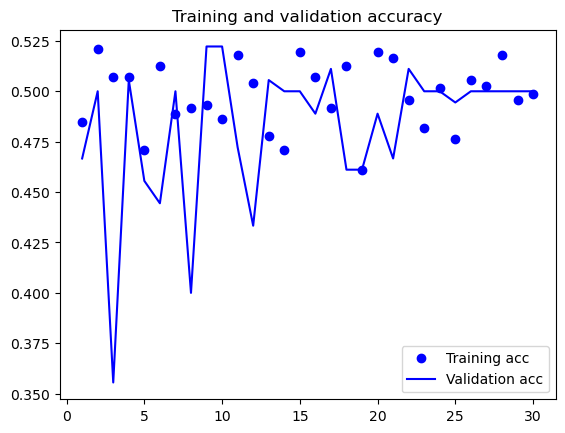

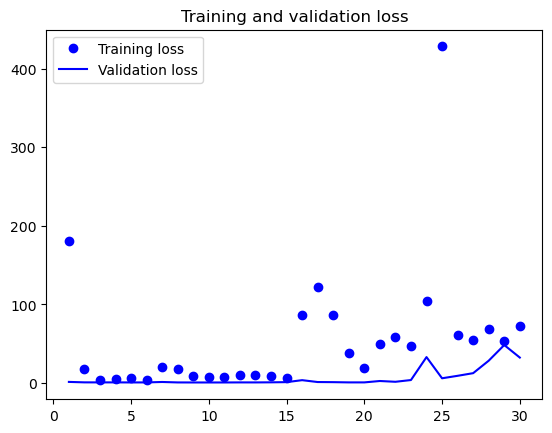

In [22]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 2.</b> Training and Validation Accuracy and Loss of CNN with Data Augmentation</center>

In [23]:
np.argmax(history.history['val_accuracy'])

8

In [24]:
history.history['val_accuracy'][8]

0.5222222208976746

In [25]:
history.history['val_precision'][8]

0.5714285969734192

In [26]:
history.history['val_recall'][8]

0.17777778208255768

In [50]:
keras.backend.clear_session()

# Appendix 5. VGG-16 (Frozen)

In [51]:
conv_base_vgg16 = keras.applications.VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(250, 250, 3))
def build_custom_model(base_model):
    model = models.Sequential()
    model.add(base_model)
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model
vgg16_with_dense = build_custom_model(conv_base_vgg16)

In [52]:
def freeze_conv_base(base_model, augmented_model):
    print('This is the number of trainable weights before freezing the conv base:',
          len(augmented_model.trainable_weights))
    base_model.trainable = False
    print('This is the number of trainable weights after freezing the conv base:',
          len(augmented_model.trainable_weights))

print("Freezing VGG16...")
freeze_conv_base(conv_base_vgg16, vgg16_with_dense)

Freezing VGG16...
This is the number of trainable weights before freezing the conv base: 32
This is the number of trainable weights after freezing the conv base: 6


In [53]:
checkpoint_filepath = 'model_checkpoint_vgg16_frozen.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

vgg16_with_dense.compile(optimizer='rmsprop', loss='binary_crossentropy',
                         metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [54]:
history = vgg16_with_dense.fit(train_ds, validation_data=validation_ds, epochs=30, batch_size=256,
                              callbacks=[model_checkpoint_callback])

Epoch 1/30
6/6 [==============================] - 5s 736ms/step - loss: 84.2605 - accuracy: 0.5931 - recall: 0.5635 - precision: 0.6018 - val_loss: 10.1969 - val_accuracy: 0.8333 - val_recall: 0.8000 - val_precision: 0.8571
Epoch 2/30
6/6 [==============================] - 4s 683ms/step - loss: 64.4969 - accuracy: 0.6639 - recall: 0.6823 - precision: 0.6604 - val_loss: 13.4961 - val_accuracy: 0.8000 - val_recall: 0.6667 - val_precision: 0.9091
Epoch 3/30
6/6 [==============================] - 5s 762ms/step - loss: 48.3284 - accuracy: 0.7083 - recall: 0.7072 - precision: 0.7111 - val_loss: 16.2446 - val_accuracy: 0.8111 - val_recall: 0.6667 - val_precision: 0.9375
Epoch 4/30
6/6 [==============================] - 4s 732ms/step - loss: 38.8682 - accuracy: 0.7694 - recall: 0.7707 - precision: 0.7707 - val_loss: 15.2037 - val_accuracy: 0.8278 - val_recall: 0.6889 - val_precision: 0.9538
Epoch 5/30
6/6 [==============================] - 5s 766ms/step - loss: 30.8349 - accuracy: 0.7972 - rec

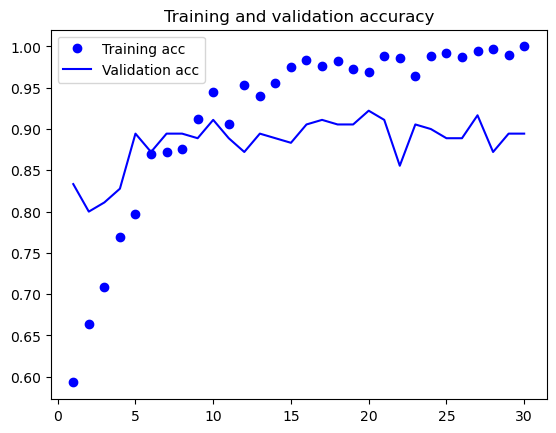

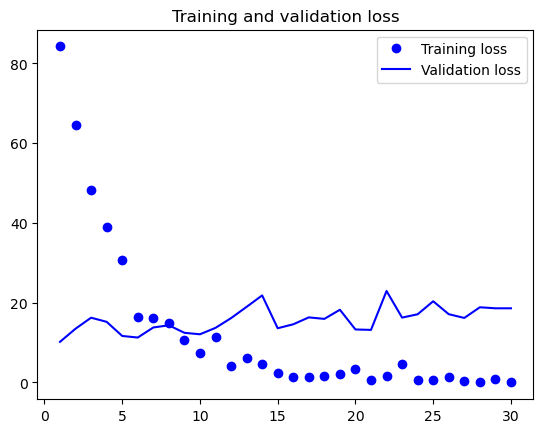

In [55]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 3.</b> Training and Validation Accuracy and Loss of Frozen VGG-16</center>

In [56]:
np.argmax(history.history['val_accuracy'])

19

In [57]:
history.history['val_accuracy'][19]

0.9222222566604614

In [58]:
history.history['val_precision'][19]

0.9042553901672363

In [59]:
history.history['val_recall'][19]

0.944444477558136

# Appendix 6. VGG-16 (Frozen then Unfrozen)

In [60]:
set_trainable=False

for layer in conv_base_vgg16.layers :
    if layer.name == 'block5_conv1' :
        set_trainable=True
    if set_trainable:
        layer.trainable=True
    else:
        layer.trainable=False

In [61]:
checkpoint_filepath = 'model_checkpoint_vgg16_unfrozen_1.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

vgg16_with_dense.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [62]:
history = vgg16_with_dense.fit(train_ds, validation_data=validation_ds, epochs=30, batch_size=256,
                              callbacks=[model_checkpoint_callback])

Epoch 1/30
6/6 [==============================] - 5s 744ms/step - loss: 23.0778 - accuracy: 0.8903 - recall_1: 0.9088 - precision_1: 0.8773 - val_loss: 34.6493 - val_accuracy: 0.8611 - val_recall_1: 0.7667 - val_precision_1: 0.9452
Epoch 2/30
6/6 [==============================] - 4s 676ms/step - loss: 0.6110 - accuracy: 0.9931 - recall_1: 0.9890 - precision_1: 0.9972 - val_loss: 26.9012 - val_accuracy: 0.8611 - val_recall_1: 0.8111 - val_precision_1: 0.9012
Epoch 3/30
6/6 [==============================] - 5s 803ms/step - loss: 1.4861 - accuracy: 0.9931 - recall_1: 0.9917 - precision_1: 0.9945 - val_loss: 23.3736 - val_accuracy: 0.8722 - val_recall_1: 0.8556 - val_precision_1: 0.8851
Epoch 4/30
6/6 [==============================] - 5s 812ms/step - loss: 0.1291 - accuracy: 0.9972 - recall_1: 0.9972 - precision_1: 0.9972 - val_loss: 24.1040 - val_accuracy: 0.8611 - val_recall_1: 0.8222 - val_precision_1: 0.8916
Epoch 5/30
6/6 [==============================] - 5s 792ms/step - loss: 0.3

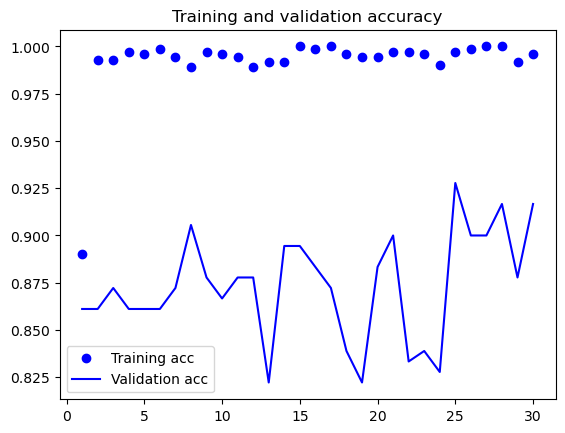

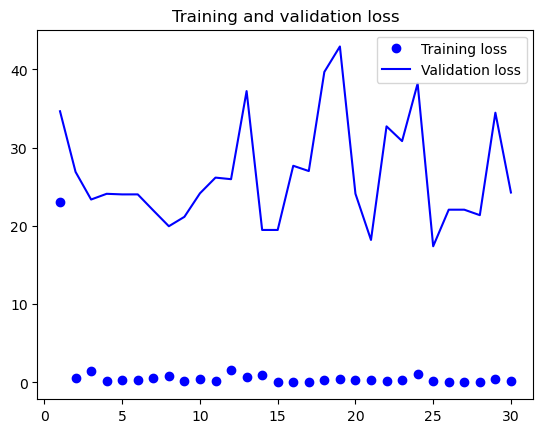

In [63]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 4.</b> Training and Validation Accuracy and Loss of Frozen then Unfrozen VGG-16</center>

In [64]:
np.argmax(history.history['val_accuracy'])

24

In [65]:
history.history['val_accuracy'][24]

0.9277778267860413

In [66]:
history.history['val_precision_1'][24]

0.9529411792755127

In [67]:
history.history['val_recall_1'][24]

0.9000000357627869

In [85]:
keras.backend.clear_session()

# Appendix 7. VGG16 (Directly Unfrozen)

In [86]:
conv_base_vgg16 = keras.applications.VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(250, 250, 3))
def build_custom_model(base_model):
    model = models.Sequential()
    model.add(base_model)
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model
vgg16_with_dense = build_custom_model(conv_base_vgg16)

In [87]:
set_trainable=False

for layer in conv_base_vgg16.layers :
    if layer.name == 'block5_conv1' :
        set_trainable=True
    if set_trainable:
        layer.trainable=True
    else:
        layer.trainable=False

In [88]:
checkpoint_filepath = 'model_checkpoint_vgg16_unfrozen_2.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

vgg16_with_dense.compile(optimizer='rmsprop', loss='binary_crossentropy',
                         metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [89]:
history = vgg16_with_dense.fit(train_ds, validation_data=validation_ds, epochs=30, batch_size=128,
                              callbacks=[model_checkpoint_callback])

Epoch 1/30
6/6 [==============================] - 6s 854ms/step - loss: 11701.9111 - accuracy: 0.4778 - recall: 0.3481 - precision: 0.4737 - val_loss: 219.2007 - val_accuracy: 0.5000 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 2/30
6/6 [==============================] - 5s 829ms/step - loss: 304.4226 - accuracy: 0.4875 - recall: 0.4724 - precision: 0.4900 - val_loss: 4.4905 - val_accuracy: 0.6278 - val_recall: 0.3333 - val_precision: 0.8108
Epoch 3/30
6/6 [==============================] - 5s 873ms/step - loss: 30.2770 - accuracy: 0.5306 - recall: 0.4751 - precision: 0.5375 - val_loss: 5.9850 - val_accuracy: 0.5500 - val_recall: 0.1444 - val_precision: 0.7647
Epoch 4/30
6/6 [==============================] - 5s 900ms/step - loss: 17.5430 - accuracy: 0.5514 - recall: 0.5856 - precision: 0.5506 - val_loss: 1.7998 - val_accuracy: 0.6278 - val_recall: 0.2889 - val_precision: 0.8966
Epoch 5/30
6/6 [==============================] - 5s 870ms/step - loss: 5.3815 - accuracy: 0.5

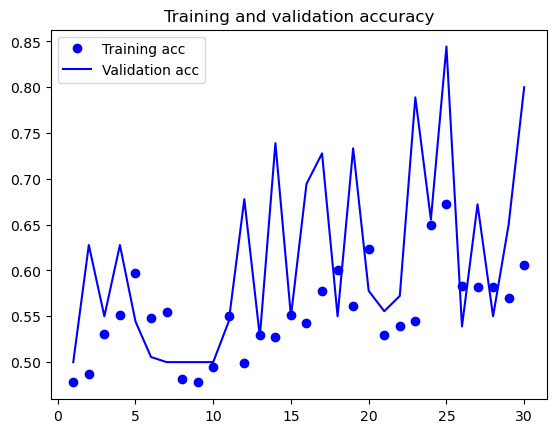

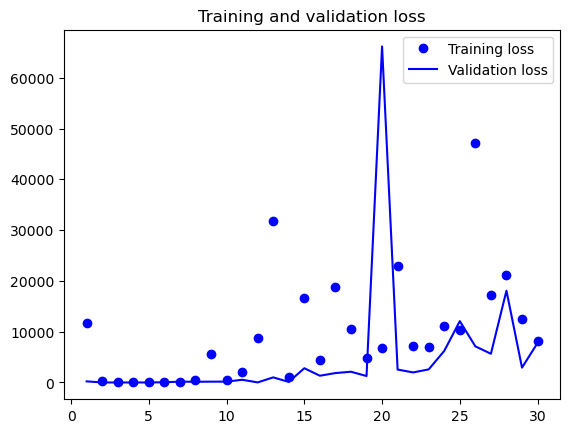

In [90]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 5.</b> Training and Validation Accuracy and Loss of Directly Unfrozen VGG-16</center>

In [91]:
np.argmax(history.history['val_accuracy'])

24

In [92]:
history.history['val_accuracy'][24]

0.8444444537162781

In [93]:
history.history['val_precision'][24]

0.8163264989852905

In [94]:
history.history['val_recall'][24]

0.8888888955116272

In [132]:
keras.backend.clear_session()

# Appendix 8. Xception (Frozen)

In [133]:
xc_model = Xception(weights='imagenet',
    include_top=False, 
    input_shape=(250, 250, 3))

In [134]:
def build_custom_model(base_model):
    model = models.Sequential()
    model.add(layers.Rescaling(1./255))
    model.add(base_model)
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [135]:
xc_model_custom = build_custom_model(xc_model)

In [136]:
xc_model_custom.build((None, 250, 250, 3))

In [137]:
def freeze_conv_base(base_model, augmented_model):
    print('This is the number of trainable weights before freezing the conv base:',
          len(augmented_model.trainable_weights))
    base_model.trainable = False
    print('This is the number of trainable weights after freezing the conv base:',
          len(augmented_model.trainable_weights))

print("Freezing Xception...")
freeze_conv_base(xc_model, xc_model_custom)

Freezing Xception...
This is the number of trainable weights before freezing the conv base: 160
This is the number of trainable weights after freezing the conv base: 6


In [138]:
xc_model_custom.compile(
    optimizer="rmsprop",
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [139]:
checkpoint_filepath = 'model_checkpoint_xc_frozen.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

history = xc_model_custom.fit(
    train_ds,
    epochs=30,
    validation_data=validation_ds,
    callbacks=[model_checkpoint_callback]
)

Epoch 1/30
6/6 [==============================] - 14s 2s/step - loss: 21.6594 - accuracy: 0.6681 - recall: 0.8011 - precision: 0.6346 - val_loss: 2.0615 - val_accuracy: 0.8611 - val_recall: 0.9000 - val_precision: 0.8351
Epoch 2/30
6/6 [==============================] - 5s 768ms/step - loss: 3.2225 - accuracy: 0.8125 - recall: 0.8149 - precision: 0.8127 - val_loss: 2.0980 - val_accuracy: 0.8722 - val_recall: 0.9222 - val_precision: 0.8384
Epoch 3/30
6/6 [==============================] - 5s 909ms/step - loss: 2.9165 - accuracy: 0.8292 - recall: 0.8370 - precision: 0.8256 - val_loss: 1.7281 - val_accuracy: 0.9000 - val_recall: 0.9222 - val_precision: 0.8830
Epoch 4/30
6/6 [==============================] - 5s 835ms/step - loss: 2.0159 - accuracy: 0.8625 - recall: 0.8591 - precision: 0.8663 - val_loss: 1.6851 - val_accuracy: 0.8944 - val_recall: 0.9333 - val_precision: 0.8660
Epoch 5/30
6/6 [==============================] - 5s 857ms/step - loss: 1.3137 - accuracy: 0.8917 - recall: 0.900

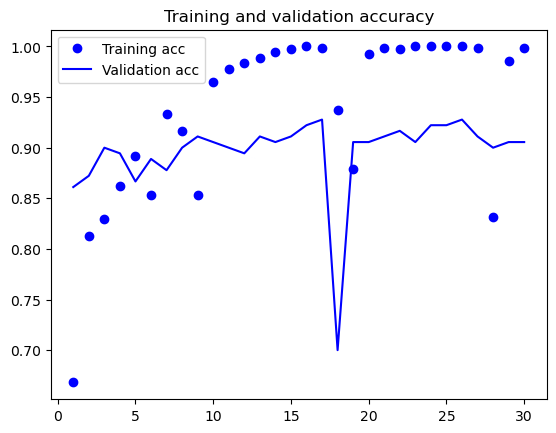

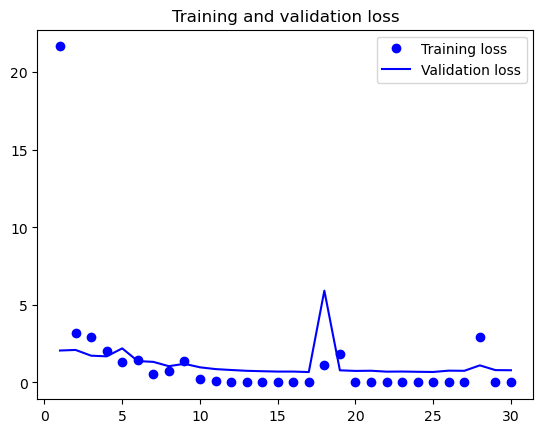

In [140]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 6.</b> Training and Validation Accuracy and Loss of Frozen Xception</center>

In [141]:
np.argmax(history.history['val_accuracy'])

16

In [142]:
history.history['val_accuracy'][16]

0.9277778267860413

In [143]:
history.history['val_precision'][16]

0.932584285736084

In [144]:
history.history['val_recall'][16]

0.9222222566604614

# Appendix 9. Xception (Frozen then Unfrozen)

In [145]:
set_trainable=False

for layer in xc_model.layers :
    if layer.name == 'block14_sepconv1' :
        set_trainable=True
    if set_trainable:
        layer.trainable=True
    else:
        layer.trainable=False

In [146]:
xc_model_custom.compile(
    optimizer="rmsprop",
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [147]:
from keras.callbacks import ModelCheckpoint

checkpoint_filepath = 'model_checkpoint_xc_frozen_unfrozen.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

history = xc_model_custom.fit(
    train_ds,
    epochs=30,
    validation_data=validation_ds,
    callbacks=[model_checkpoint_callback],
)

Epoch 1/30
6/6 [==============================] - 14s 2s/step - loss: 3.4958 - accuracy: 0.7583 - recall_1: 0.8204 - precision_1: 0.7315 - val_loss: 1.3201 - val_accuracy: 0.8944 - val_recall_1: 0.8222 - val_precision_1: 0.9610
Epoch 2/30
6/6 [==============================] - 8s 1s/step - loss: 0.1458 - accuracy: 0.9736 - recall_1: 0.9586 - precision_1: 0.9886 - val_loss: 0.7894 - val_accuracy: 0.9056 - val_recall_1: 0.9000 - val_precision_1: 0.9101
Epoch 3/30
6/6 [==============================] - 10s 2s/step - loss: 0.0363 - accuracy: 0.9917 - recall_1: 0.9890 - precision_1: 0.9944 - val_loss: 0.7687 - val_accuracy: 0.9111 - val_recall_1: 0.9111 - val_precision_1: 0.9111
Epoch 4/30
6/6 [==============================] - 8s 1s/step - loss: 0.0362 - accuracy: 0.9903 - recall_1: 0.9890 - precision_1: 0.9917 - val_loss: 0.8768 - val_accuracy: 0.9111 - val_recall_1: 0.8778 - val_precision_1: 0.9405
Epoch 5/30
6/6 [==============================] - 8s 1s/step - loss: 0.0339 - accuracy: 0.

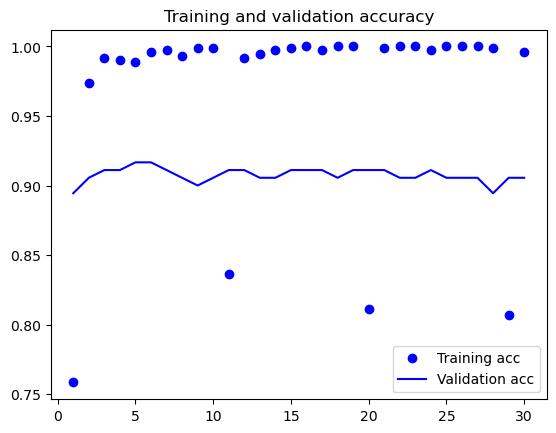

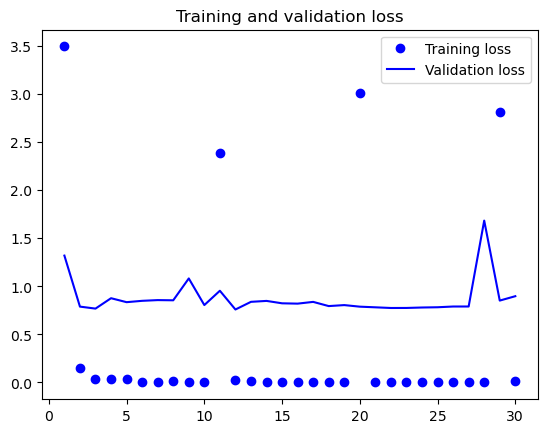

In [148]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 7.</b> Training and Validation Accuracy and Loss of Frozen then Unfrozen Xception</center>

In [149]:
np.argmax(history.history['val_accuracy'])

4

In [150]:
history.history['val_accuracy'][4]

0.9166666865348816

In [151]:
history.history['val_precision_1'][4]

0.9213483333587646

In [152]:
history.history['val_recall_1'][4]

0.9111111164093018

In [800]:
keras.backend.clear_session()

# Appendix 10. Xception (Directly Unfrozen)

In [801]:
xc_model = Xception(weights='imagenet',
    include_top=False, 
    input_shape=(250, 250, 3))

In [802]:
def build_custom_model(base_model):
    model = models.Sequential()
    model.add(layers.Rescaling(1./255))
    model.add(base_model)
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [803]:
xc_model_custom = build_custom_model(xc_model)

In [804]:
set_trainable=False

for layer in xc_model.layers :
    if layer.name == 'block14_sepconv1' :
        set_trainable=True
    if set_trainable:
        layer.trainable=True
    else:
        layer.trainable=False

In [805]:
xc_model_custom.compile(
    optimizer="rmsprop",
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision()])

In [806]:
checkpoint_filepath = 'model_checkpoint_xc_direct_unfrozen.h5' 
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False, 
    monitor='val_accuracy',   
    mode='max',              
    save_best_only=True      
)

history = xc_model_custom.fit(
    train_ds,
    epochs=30,
    validation_data=validation_ds,
    callbacks=[model_checkpoint_callback]
)

Epoch 1/30
6/6 [==============================] - ETA: 0s - loss: 13.3595 - accuracy: 0.6111 - recall: 0.4862 - precision: 0.6519

/Users/pmmedina/anaconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


6/6 [==============================] - 21s 3s/step - loss: 13.3595 - accuracy: 0.6111 - recall: 0.4862 - precision: 0.6519 - val_loss: 14.1141 - val_accuracy: 0.6556 - val_recall: 0.8889 - val_precision: 0.6061
Epoch 2/30
6/6 [==============================] - 7s 1s/step - loss: 3.7947 - accuracy: 0.7792 - recall: 0.7790 - precision: 0.7812 - val_loss: 2.1747 - val_accuracy: 0.8889 - val_recall: 0.8556 - val_precision: 0.9167
Epoch 3/30
6/6 [==============================] - 6s 949ms/step - loss: 0.5557 - accuracy: 0.9097 - recall: 0.9503 - precision: 0.8798 - val_loss: 2.0912 - val_accuracy: 0.9000 - val_recall: 0.8778 - val_precision: 0.9186
Epoch 4/30
6/6 [==============================] - 6s 943ms/step - loss: 0.2205 - accuracy: 0.9542 - recall: 0.9807 - precision: 0.9318 - val_loss: 1.6917 - val_accuracy: 0.9000 - val_recall: 0.8556 - val_precision: 0.9390
Epoch 5/30
6/6 [==============================] - 6s 980ms/step - loss: 1.3983 - accuracy: 0.8903 - recall: 0.9033 - precision

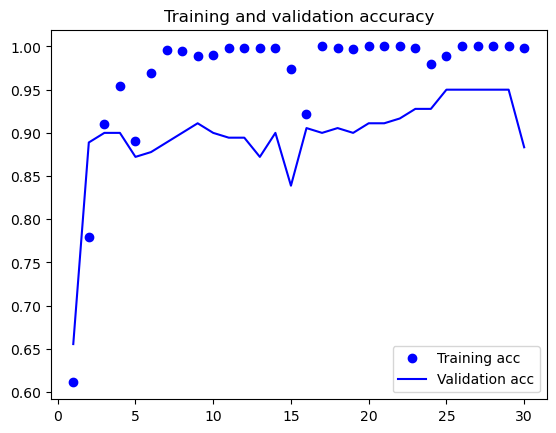

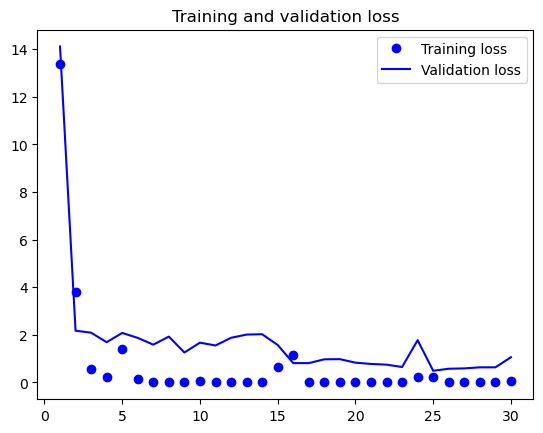

In [809]:
%matplotlib inline

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

<center><b>Figure 8.</b> Training and Validation Accuracy and Loss of Directly Unfrozen VGG-16</center>

In [810]:
np.argmax(history.history['val_accuracy'])

24

In [813]:
history.history['val_accuracy'][24]

0.9500000476837158

In [814]:
history.history['val_precision'][24]

0.9550561904907227

In [815]:
history.history['val_recall'][24]

0.944444477558136

# Appendix 11. Comparison of All Models

<b>Table 1.</b> Comparison of All Models

| Validation Metrics | Raw CNN | CNN with Data Augmentation | VGG-16 (Frozen) | VGG-16 (Frozen then Unfrozen) | VGG-16 (Directly Unfrozen) | Xception (Frozen) | Xception (Frozen then Unfrozen) | Xception (Directly Unfrozen) | 
| :---------------- | :------ | :---- | :---------------- | :------ | :---- | :---------------- | :------ | :---- |
| Validation Accuracy  | 0.72   | 0.52 |  0.92   | 0.93 |  0.84   | 0.93 |  0.92   | **0.96** |
| Validation Precision |   0.69   | 0.57 |    0.90   | 0.95 |    0.82   | 0.93 | 0.92 | **0.97** |
| Validation Recall    | 0.78  | 0.18 | **0.94** | 0.90 | 0.89   | 0.92 | 0.91  | **0.94** |

Given this, it is best to use a directly unfrozen Xception model given that it has the highest validation accuracy, validation precision, and validation recall (having the same validation recall as the Frozen VGG-16 model) out of all models.

# Appendix 12. Xception (Directly Unfrozen) Test Metrics

## Appendix 12.1 Last Epoch Model

In [816]:
xc_model_custom.evaluate(test_ds)

3/3 [==============================] - 4s 1s/step - loss: 1.0436 - accuracy: 0.8911 - recall: 0.8000 - precision: 0.9811


[1.0436328649520874, 0.8910505771636963, 0.800000011920929, 0.9811320900917053]

## Appendix 12.2 Checkpoint Model

In [880]:
xc_model_custom_final = tf.keras.models.load_model("model_checkpoint_xc_direct_unfrozen.h5")
xc_model_custom_final.evaluate(test_ds)

3/3 [==============================] - 7s 1s/step - loss: 0.4512 - accuracy: 0.9572 - recall: 0.9385 - precision: 0.9760


[0.45119330286979675,
 0.957198441028595,
 0.9384615421295166,
 0.9760000705718994]

Given that the Checkpoint Model performs better than the Last Epoch Model, the Checkpoint Model would be used.

# Appendix 13. Finding Best Threshold for Final Model

## Appendix 13.1. Base Threshold of 0.5

In [7]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_ds:
    pred = np.max(xc_model_custom_final.predict(x), axis =-1)
    pred = np.where(pred >= 0.5, 1, 0)
    predictions = np.concatenate([predictions, pred])
    labels = np.concatenate([labels, np.max(y.numpy(), axis=-1)])

2024-06-12 02:23:30.440101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 557ms/step


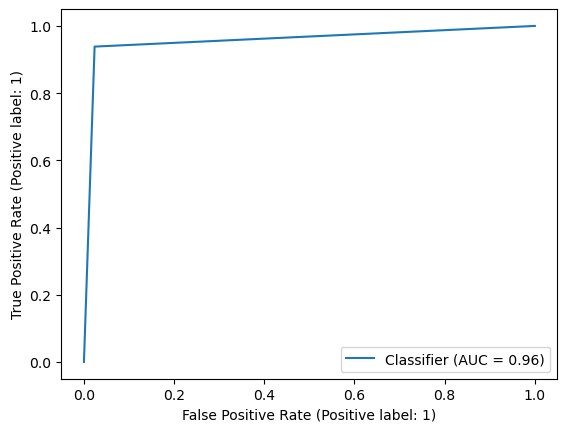

In [8]:
from sklearn.metrics import RocCurveDisplay

ax = RocCurveDisplay.from_predictions(labels, predictions)

<center><b>Figure 9.</b> ROC Curve (Baseline Threshold)</center>

In [9]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve

result = confusion_matrix(labels, predictions)
print(result)

[[124   3]
 [  8 122]]


In [10]:
acc_base = accuracy_score(labels, predictions)
prec_base = precision_score(labels, predictions)
recall_base = recall_score(labels, predictions)

In [11]:
acc_base

0.9571984435797666

In [12]:
prec_base

0.976

In [13]:
recall_base

0.9384615384615385

## Appendix 13.2. Youden's Index

In [14]:
def sensivity_specifity_cutoff(y_true, y_score):
    """Find data-driven cut-off for classification
    
    Cut-off is determied using Youden's index defined as sensitivity + specificity - 1.
    
    Parameters
    ----------
    
    y_true : array, shape = [n_samples]
        True binary labels.
        
    y_score : array, shape = [n_samples]
        Target scores, can either be probability estimates of the positive class,
        confidence values, or non-thresholded measure of decisions (as returned by
        “decision_function” on some classifiers).
        
    Returns
    ----------
    tuple
        Tuple containing the "best" threshold and the corresponding
        false positive rate
    """
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    idx = np.argmax(tpr - fpr)
    return thresholds[idx], fpr[idx]

In [15]:
# Youden's Index
threshold_yd, fpr_yd = sensivity_specifity_cutoff(labels, predictions)

In [16]:
threshold_yd

1.0

In [17]:
fpr_yd

0.023622047244094488

In [18]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_ds:
    pred = np.max(xc_model_custom_final.predict(x), axis =-1)
    pred = np.where(pred >= 1.0, 1, 0)
    predictions = np.concatenate([predictions, pred])
    labels = np.concatenate([labels, np.max(y.numpy(), axis=-1)])

1/1 [==============================] - 0s 20ms/step


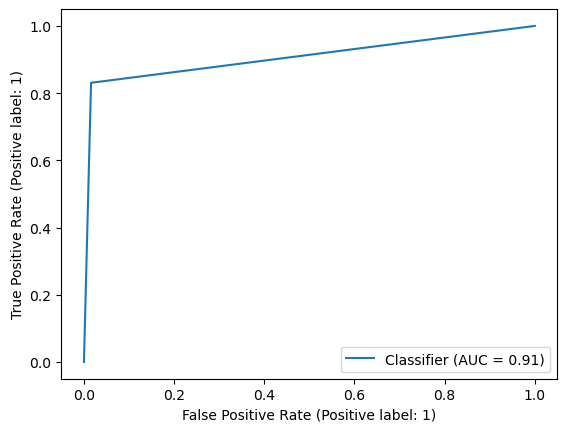

In [19]:
ax = RocCurveDisplay.from_predictions(labels, predictions)

<center><b>Figure 10.</b> ROC Curve (Youden's Index)</center>

In [20]:
result = confusion_matrix(labels, predictions)
print(result)

[[125   2]
 [ 22 108]]


In [21]:
acc_yd = accuracy_score(labels, predictions)
prec_yd = precision_score(labels, predictions)
recall_yd = recall_score(labels, predictions)

In [22]:
acc_yd

0.9066147859922179

In [23]:
prec_yd

0.9818181818181818

In [24]:
recall_yd

0.8307692307692308

## Appendix 13.3. Closest to (0,1) - ER Index

In [25]:
import pandas as pd

In [26]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_ds:
    pred = np.max(xc_model_custom_final.predict(x), axis =-1)
    pred = np.where(pred >= 0.5, 1, 0)
    predictions = np.concatenate([predictions, pred])
    labels = np.concatenate([labels, np.max(y.numpy(), axis=-1)])

1/1 [==============================] - 0s 32ms/step


In [27]:
fpr, tpr, thresholds = roc_curve(labels, predictions)

In [28]:
df_er = pd.DataFrame(fpr[:, np.newaxis],
                           columns=['fpr'])
df_er['tpr'] = tpr[:, np.newaxis]
df_er['thresholds'] = thresholds[:, np.newaxis]

In [29]:
df_er['d2'] = np.sqrt((1 - df_er['tpr'])**2 + (1 - 1 - df_er['fpr'])**2)

In [30]:
df_er['d2'].idxmin()

1

In [31]:
er_smoking = df_er.iloc[1]['d2']

In [32]:
er_smoking_fpr = df_er.iloc[1]['fpr']

In [33]:
print("ER Index (closest to (0, 1)) is at the probability threshold of %f" % (df_er.iloc[1]['d2']))

ER Index (closest to (0, 1)) is at the probability threshold of 0.065916


In [34]:
print("ER Index has a FPR of %f" % (er_smoking_fpr))

ER Index has a FPR of 0.023622


In [35]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_ds:
    pred = np.max(xc_model_custom_final.predict(x), axis =-1)
    pred = np.where(pred >= df_er.iloc[1]['d2'], 1, 0)
    predictions = np.concatenate([predictions, pred])
    labels = np.concatenate([labels, np.max(y.numpy(), axis=-1)])

1/1 [==============================] - 0s 20ms/step


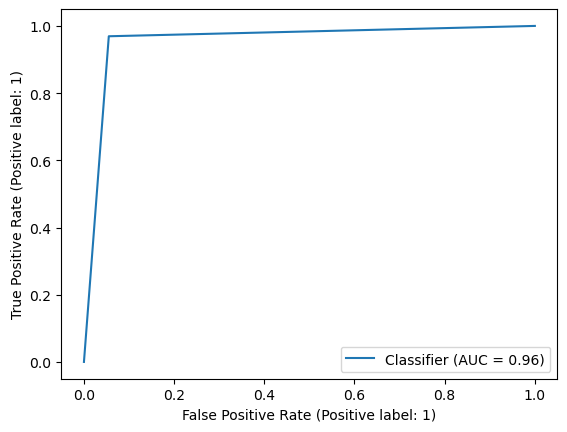

In [36]:
ax = RocCurveDisplay.from_predictions(labels, predictions)

<center><b>Figure 11.</b> ROC Curve (Closest to (0, 1) - ER Index)</center>

In [37]:
result = confusion_matrix(labels, predictions)
print(result)

[[120   7]
 [  4 126]]


In [38]:
acc_er = accuracy_score(labels, predictions)
prec_er = precision_score(labels, predictions)
recall_er = recall_score(labels, predictions)

In [39]:
acc_er

0.9571984435797666

In [40]:
prec_er

0.9473684210526315

In [41]:
recall_er

0.9692307692307692

## Appendix 13.4. F-Score Index

In [42]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_ds:
    pred = np.max(xc_model_custom_final.predict(x), axis =-1)
    pred = np.where(pred >= 0.5, 1, 0)
    predictions = np.concatenate([predictions, pred])
    labels = np.concatenate([labels, np.max(y.numpy(), axis=-1)])

1/1 [==============================] - 0s 21ms/step


In [43]:
fpr, tpr, thresholds = roc_curve(labels, predictions)

In [44]:
df_f1_score_smoking = pd.DataFrame(columns=['threshold', 'f1', 'fpr'])
for i, (fp, tp, threshold) in enumerate(zip(fpr, tpr, thresholds)):
    recall = tp
    smoking_f1_score = pd.Series(predictions).apply(
        lambda x: 1 if x >= threshold else 0)
    precision = precision_score(labels, smoking_f1_score)
    f1 = (2 * recall * precision)/(recall + precision)
    df_f1_score_smoking.loc[i] = [threshold, f1, fp]

/Users/pmmedina/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/var/folders/l2/tjtfb3_n2g91w6pt65qtdzlr0000gn/T/ipykernel_94280/722740746.py:7: RuntimeWarning: invalid value encountered in double_scalars
  f1 = (2 * recall * precision)/(recall + precision)


In [45]:
df_f1_score_smoking['f1'].idxmax()

1

In [46]:
f1_score_smoking = df_f1_score_smoking.iloc[1]['threshold']

In [47]:
f1_score_smoking_fpr = df_f1_score_smoking.iloc[1]['fpr']

In [48]:
print("Highest F-1 score is at the probability threshold of %f" % (df_f1_score_smoking.iloc[1]['threshold']))

Highest F-1 score is at the probability threshold of 1.000000


In [49]:
print("F-1 Score Index has a FPR of %f" % (f1_score_smoking_fpr))

F-1 Score Index has a FPR of 0.023622


Given that F-1 Score Index has the same threshold as Youden's Index, it would not be evaluated again as they would provide the same results.

# Appendix 14. Comparison of the Four Thresholds

<b>Table 2.</b> Comparison of the Four Thresholds

| Test Metrics | Baseline Index (0.5) | Youden's Index | Closest to (0, 1) - ER Index | F-1 Score Index |
| :---------------- | :------ | :---- | :---------------- | :---------------- | 
| Value | 0.5 | 1.0 | 0.07 | 1.0 | 1.0 |
| Test Accuracy  | **0.96** | 0.91 | **0.96** | 0.91 |
| Test Precision | **0.98** | **0.98** | 0.95 | **0.98** |
| Test Recall    | 0.94 | 0.83 | **0.97** | 0.83 |


Given that the team values the maximization of recall or capturing all possible or potential smokers within an area, the index which would be used would be the Closest to (0, 1) or the ER Index.

## Appendix 14.1. Pickling Value of Closest to (0, 1) - ER Index

In [50]:
import pickle

In [51]:
with open('er_index.pickle', 'wb') as handle:
    pickle.dump(df_er.iloc[1]['d2'], handle, protocol=pickle.HIGHEST_PROTOCOL)

# Appendix 15. GradCam for Explainability of Model

In [52]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras

# Display
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.pyplot as plt
import pickle

In [53]:
xc_model_custom_final = tf.keras.models.load_model("model_checkpoint_xc_direct_unfrozen.h5")

In [54]:
with open("er_index.pickle", "rb") as handle:
    er_index = pickle.load(handle)

In [55]:
def get_img_array(img_path, size):
    """Return image array from image path.
    
    Parameters
    ----------
    
    img_path : string
        Path of image
        
    size : tuple
        Target dimensions of image
        
    Returns
    ----------
    array-like
        Array containing pixel values of image
    """
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """Create Gradcam heatmap from the model and the image.
    
    Parameters
    ----------
    
    img_array : array-like
        Array containing pixel values of image
        
    model : Keras model
        Keras CNN model

    last_conv_layer_name : string
        Name of last convolutional layer of CNN model

    pred_index : int
        Prediction value which can be 0 or 1
        
    Returns
    ----------
    array-like
        Array containing pixel values of heatmap
    """
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_path, heatmap, alpha=0.9):
    """Display heatmap superimposed on image.
    
    Parameters
    ----------
    
    img_path : string
        Path of image
        
    heatmap : array-like
        Array containing pixel values of heatmap

    alpha : float
        Alpha value for the heatmap
    """
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Display Grad CAM
    display(superimposed_img)

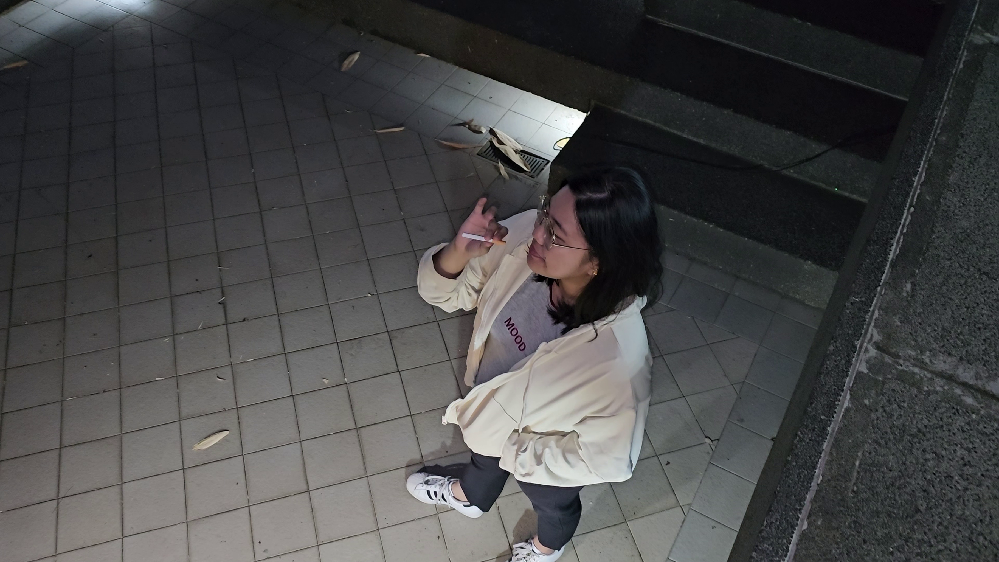

In [56]:
last_conv_layer_name = "block14_sepconv2_act"

# The local path to our target image
img_path = "Test_Pictures/pau_smoking.png"
display(Image(img_path))

<center><b>Figure 12.</b> Sample Picture</center>

In [57]:
# Prepare image
img_array = get_img_array(img_path, size=(250, 250))

# Print what the top predicted class is
preds = xc_model_custom_final.predict(img_array)

1/1 [==============================] - 1s 525ms/step


In [58]:
pred = np.where(preds >= er_index, 1, 0)[0][0]

In [59]:
preprocess_input = keras.applications.xception.preprocess_input

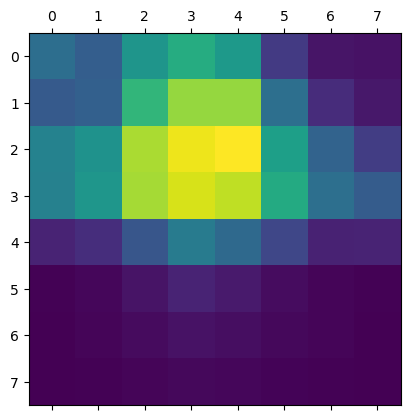

In [60]:
# Print what the top predicted class is
img_array = get_img_array(img_path, size=(250, 250))
img_pre = preprocess_input(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_pre, xc_model_custom_final.get_layer('xception'), last_conv_layer_name, pred_index=pred)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<center><b>Figure 13.</b> Heatmap for Sample Image</center>

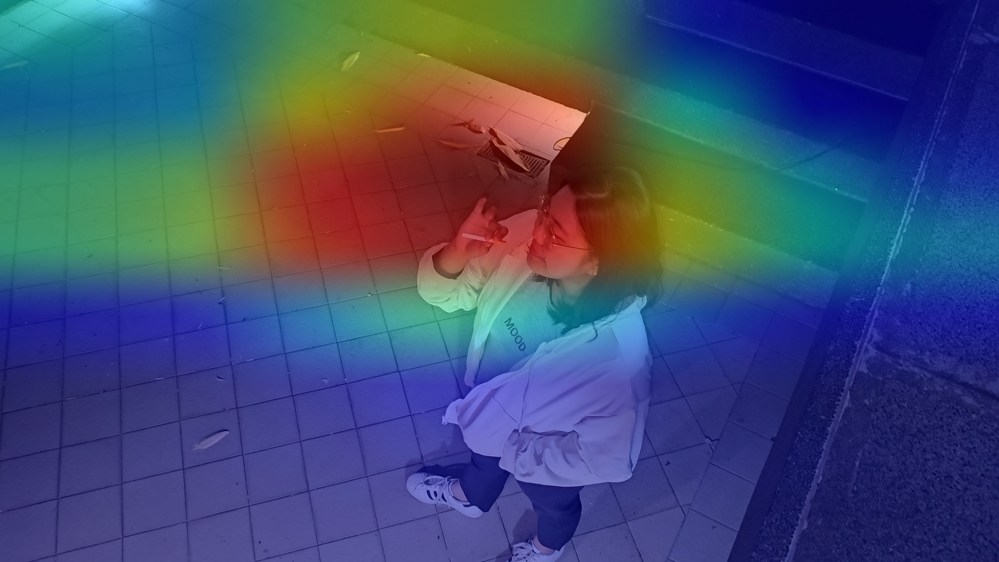

In [61]:
display_gradcam(img_path, heatmap)

<center><b>Figure 14.</b> Heatmap Superimposed on Sample Image</center>

# Appendix 16. Widget for Testing GradCam

In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras

# Display
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.pyplot as plt
import pickle

with open("er_index.pickle", "rb") as handle:
    er_index = pickle.load(handle)

In [2]:
xc_model_custom_final = tf.keras.models.load_model("model_checkpoint_xc_direct_unfrozen.h5")

2024-06-12 23:40:50.059688: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Max
2024-06-12 23:40:50.059710: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 32.00 GB
2024-06-12 23:40:50.059718: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 10.67 GB
2024-06-12 23:40:50.059744: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-06-12 23:40:50.059758: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [3]:
def get_img_array(img_path, size):
    """Return image array from image path.
    
    Parameters
    ----------
    
    img_path : string
        Path of image
        
    size : tuple
        Target dimensions of image
        
    Returns
    ----------
    array-like
        Array containing pixel values of image
    """
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """Create Gradcam heatmap from the model and the image.
    
    Parameters
    ----------
    
    img_array : array-like
        Array containing pixel values of image
        
    model : Keras model
        Keras CNN model

    last_conv_layer_name : string
        Name of last convolutional layer of CNN model

    pred_index : int
        Prediction value which can be 0 or 1
        
    Returns
    ----------
    array-like
        Array containing pixel values of heatmap
    """
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_path, heatmap, alpha=0.9):
    """Display heatmap superimposed on image.
    
    Parameters
    ----------
    
    img_path : string
        Path of image
        
    heatmap : array-like
        Array containing pixel values of heatmap

    alpha : float
        Alpha value for the heatmap
    """
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Display Grad CAM
    display(superimposed_img)

In [4]:
import ipywidgets as widgets
from os import listdir
from IPython.display import display, HTML, clear_output

def gradcam_test():
    """Display the drop-down menu widget and button widget
    """
    last_conv_layer_name = "block14_sepconv2_act"
    preprocess_input = keras.applications.xception.preprocess_input

    style = {'description_width': 'initial'}

    lst_pictures = listdir("Test_Pictures")

    files_choices = widgets.Dropdown(
        options=lst_pictures,
        value=lst_pictures[0],
        description='Picture to test:',
        disabled=False,
        style=style
    )

    display(files_choices)

    button = widgets.Button(description="Test", button_style='success')
    output = widgets.Output()
    display(button, output)

    def on_button_clicked(b):
        """Run an event given a click input of the button

        Parameters
        ----------
        b : Button
            Button
        """
        with output:
            clear_output(wait=True)
            # The local path to our target image
            img_path = f"Test_Pictures/{files_choices.value}"

            # Prepare image
            img_array = get_img_array(img_path, size=(250, 250))

            # Print what the top predicted class is
            preds = xc_model_custom_final.predict(img_array, verbose=0)

            pred = np.where(preds >= er_index, 1, 0)[0][0]

            # Print what the top predicted class is
            img_array = get_img_array(img_path, size=(250, 250))
            img_pre = preprocess_input(img_array)

            # Generate class activation heatmap
            heatmap = make_gradcam_heatmap(img_pre, xc_model_custom_final.get_layer('xception'), last_conv_layer_name, pred_index=pred)
            display_gradcam(img_path, heatmap)
            if pred == 1:
                display(HTML(f'<center><b>Figure 15.</b> Test Picture for GradCam (<b>Prediction: Smoking</b> - {files_choices.value})'))
            else:
                display(HTML(f'<center><b>Figure 15.</b> Test Picture for GradCam (<b>Prediction: Not Smoking</b> - {files_choices.value})'))

    button.on_click(on_button_clicked)

In [5]:
gradcam_test()

Dropdown(description='Picture to test:', options=('pau_smoking.png', 'jj_handcream.jpg', 'pau_laptop_2.jpg', '…

Button(button_style='success', description='Test', style=ButtonStyle())

Output()